In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import pandas as pd
import xarray
import numpy as np 
from image_handling import fiji_commands, image_functions, imagej_manager
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.colors import Normalize
from skimage.measure import label, regionprops_table, regionprops
from skimage.segmentation import find_boundaries
from skimage.morphology import dilation, disk
from skimage.draw import line
from skimage import measure
from scipy.spatial import ConvexHull
from itertools import combinations
from collections import namedtuple

In [1]:
ij = imagej_manager.ImageJManager('default').get_ij()

NameError: name 'imagej_manager' is not defined

In [3]:
images_to_plot = [r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-E7_construct-GS32_experiment-Infection_experimentcondition-Growth_replicate-1_passages-26_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif', 
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-A1_construct-1_experiment-Infection_experimentcondition-Growth_replicate-1_passages-22_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-B1_construct-2_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-C1_construct-3_experiment-Infection_experimentcondition-Growth_replicate-1_passages-31_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-D1_construct-4_experiment-Infection_experimentcondition-Growth_replicate-1_passages-20_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-E1_construct-5_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-F1_construct-6_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-G1_construct-7_experiment-Infection_experimentcondition-Growth_replicate-1_passages-26_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-H1_construct-8_experiment-Infection_experimentcondition-Growth_replicate-1_passages-25_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-A7_construct-9_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-B7_construct-10_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-C7_construct-11_experiment-Infection_experimentcondition-Growth_replicate-1_passages-27_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                  r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-D7_construct-12_experiment-Infection_experimentcondition-Growth_replicate-1_passages-22_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                 ]

In [4]:
def is_list_of_lists(item):
    return isinstance(item, list) and all(isinstance(element, list) for element in item)

def make_cmaps(color_name:list[str], color_gradients: list[list[tuple]], N_step=256):
    cmap_list = []
    if type(color_name) != list:
        color_name = [color_name]
    if not is_list_of_lists(color_gradients):
        color_gradients = [color_gradients]
    for name, color in zip(color_name, color_gradients):
        cmap = mcolors.LinearSegmentedColormap.from_list(name, color, N=N_step)
        cmap_list.append(cmap)
    return cmap_list

def concat_multiple_images(ij, image_list, channel=[0,1], timepoint=[0]):
    """
    Concatenates multiple images to enable easier plotting mechanics

    ij: imagej instance
    image_list: list of images to concatenate
    channel: List of channels to cycle and concatenate
    timepoints: list of timepoints to cycle and concatenate
    """
    
    concat_image = []
    
    for image in image_list:
        
        img = fiji_commands.read_images_to_python(ij, image)
        if 't' in img.dims:
            time_images = {x: img.isel(t=x) for x in timepoint}
        else:
            time_images = {0: img}

        
        concat_image.append(xarray.concat([xarray.concat([item.isel(ch=ch) for ch in channel], dim='ch') if 'ch' in item.dims else item for key, item in time_images.items()], dim='t'))
    new_image = xarray.concat(concat_image, dim='img')    
    return new_image  


def get_vscale(image):
    img_values = image.values
    
    vmax = np.max(img_values)
    vmin = np.min(img_values)

    return Normalize(vmin, vmax)

def calculate_pixel_fraction(scale_bar_size, x, pixel_scale)-> float:
    micron_x = x/pixel_scale
    scalebar_scale = scale_bar_size/micron_x
    return scalebar_scale

def set_scalebar(scale_size, image_x, pixel_scale):
    scale_fraction = calculate_pixel_fraction(scale_size, image_x, pixel_scale)
    scalebar = ScaleBar(1/pixel_scale, "um", 
                        frameon=False,
                        color='white', 
                        location= "lower right", 
                        fixed_value=100,
                        scale_loc="none",
                        fixed_units="um", pad=0.1, border_pad=0.05,
                        width_fraction=75/image_x)
    return scalebar


In [5]:
image_holder = concat_multiple_images(ij, images_to_plot)
print(image_holder.sizes)

Frozen({'img': 13, 't': 1, 'ch': 2, 'row': 2048, 'col': 2048})


In [6]:
from cellpose import models, core

In [7]:
core.use_gpu()

True

In [10]:
mask_imgs = segment_image(image_holder)

In [14]:
img = 9
image_trial = image_holder.isel(img=img, t=0, ch=0)
mask_trial = mask_imgs[img]

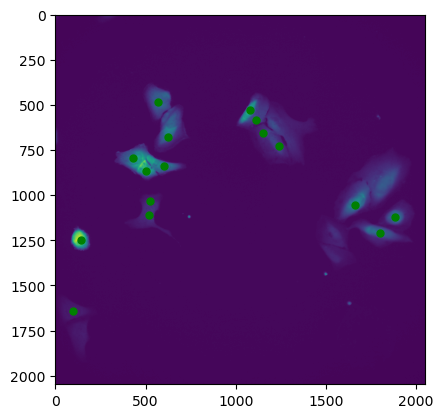

In [321]:


plt.imshow(image_trial)
regions = regionprops(mask_trial)
for prop in regions:
    plt.plot(prop.centroid[1], prop.centroid[0], '.g', markersize=10)

In [9]:
cmap = mcolors.LinearSegmentedColormap.from_list('black_to_blue', [(0, 0, 0), (0, 0, 1)], 256)

def cellpose_seg(image, model='cyto3', use_gpu=True, channels=[0, 0], diams=60):
    '''
    Segment a single image using Cellpose.

    Parameters:
        image : 2D or 3D numpy array
        model : str, Cellpose model type (e.g., 'cyto3', 'nuclei')
        use_gpu : bool, whether to use GPU if available
        channels : list of int, channel indices for Cellpose
        diams : float or None, approximate cell diameter

    Returns:
        masks : 2D numpy array of segmentation masks
    '''
    use_gpu = use_gpu and core.use_gpu()
    model_instance = models.Cellpose(gpu=use_gpu, model_type=model)
    masks, _, _, _ = model_instance.eval(image, diameter=diams, channels=channels)
    return masks


def segment_image(image_array, model='cyto3', use_gpu=True, channels=[0, 0], diams=60):
    '''
    Apply Cellpose segmentation to all images in an xarray DataArray.

    Parameters:
        image_array : xarray.DataArray, shape should include 'img', 'ch', and 't'
        model, use_gpu, channels, diams : forwarded to `cellpose_seg`

    Returns:
        mask_dic : dict mapping image index to segmentation mask
    '''
    ch_1_imgs = image_array.isel(ch=0)
    
    mask_dic = {}
    for im in range(ch_1_imgs.sizes['img']):
        tmp_img = ch_1_imgs.isel(img=im, t=0).values
        mask = cellpose_seg(tmp_img, model=model, use_gpu=use_gpu, channels=channels, diams=diams)
        mask_dic[im] = mask
        
    return mask_dic

def create_mask_overlay(mask: np.array, rgba: list[int]) -> np.array:
    '''
    Create an overlay of a mask on an image using colored boundaries.
    
    Parameters:
      
        mask : 2D numpy array
            The segmentation mask.
        rgba : list of float
            RGBA color for the overlay mask boundaries.
    
    Returns:
        fig : matplotlib Figure
            The figure containing the overlay plot.
    '''
    # Find boundaries and dilate to simulate 1.5px thickness
    boundaries = find_boundaries(mask, mode='outer')
    thick_boundaries = dilation(boundaries, disk(1))  # disk(1) is ~1.5px
    
    # Create an empty RGBA image and fill in the boundary pixels
    tmp_rgba = np.zeros((*mask.shape, 4), dtype=np.float32)
    tmp_rgba[thick_boundaries] = rgba  # apply rgba color to boundaries
    
    return tmp_rgba
    
def get_centroids(regions_prop):
    '''
    Plot centroids of labeled regions.

    Parameters:
        regions_prop : list
            List of region properties (e.g., from skimage.measure.regionprops).
        color_and_style : str
            Matplotlib style string for the marker.
        markersize : int
            Size of the marker.

    Returns:
        df : pandas object for plotting centroids if needed
            The figure and axes containing the plot.
    '''
    centroid_x_list, centroid_y_list = [] , []
    
    for region in regions_prop:
        centroid_x, centroid_y = region.centroid[1], region.centroid[0]
        centroid_x_list.append(centroid_x)
        centroid_y_list.append(centroid_y)
    
    df = pd.DataFrame({'centroid_x': centroid_x_list,
                      'centroid_y': centroid_y_list})
    
    return df

def calculate_feret_coordinates(coords):
    '''
    Calculate the endpoints of the maximum Feret diameter from a set of coordinates.

    Parameters:
        coords : (N, 2) ndarray
            Array of (row, col) or (y, x) coordinates.

    Returns:
        endpoints : tuple of two (2,) ndarrays
            The two points (as NumPy arrays) that are farthest apart on the convex hull.
    '''
    if len(coords) < 3:
        raise ValueError("At least 3 points are required to compute a convex hull.")
    
    hull = ConvexHull(coords)
    hull_points = coords[hull.vertices]

    # Compute pairwise distances on convex hull
    max_dist = 0
    endpoints = None
    for p1, p2 in combinations(hull_points, 2):
        dist = np.linalg.norm(p1 - p2)
        if dist > max_dist:
            max_dist = dist
            endpoints = (p1, p2)

    return endpoints

def return_intercepts(endpoints):
    '''
    Unpacks two endpoint coordinates into individual x/y components.

    Parameters:
        endpoints : tuple of two (y, x) coordinate arrays

    Returns:
        x0, y0, x1, y1 : float
            Individual coordinates of the two endpoints
    '''
    y0, x0 = endpoints[0]
    y1, x1 = endpoints[1]
    return x0, y0, x1, y1 

def draw_feret_lines(endpoints, mask):
    '''
    Draws a line between two endpoints and returns in-bounds pixel indices.

    Parameters:
        endpoints : tuple of two (y, x) points
        mask : 2D numpy array
            Used for boundary checking

    Returns:
        rr, cc : numpy arrays
            Row and column indices of pixels along the line
    '''
    x0, y0, x1, y1 = return_intercepts(endpoints)
    rr, cc = line(int(y0), int(x0), int(y1), int(x1))
    
    # Ensure all line coordinates are within mask bounds
    in_bounds = (
        (0 <= rr) & (rr < mask.shape[0]) &
        (0 <= cc) & (cc < mask.shape[1])
    )
    rr, cc = rr[in_bounds], cc[in_bounds]
    return rr, cc

def feret_lines_coordinates(intercept_list, linecolor='red', linewidth=2):
    '''
    Plots Feret lines on a blank canvas.

    Parameters:
        intercept_list : list of [[x0, y0], [x1, y1]] line endpoints
        linecolor : str
            Color of the lines
        linewidth : float
            Thickness of the lines

    Returns:
        x_vals, y_vals: list of coordinates for plotting
    '''
    x_val_list, y_val_list = [], []
    for intercepts in intercept_list:
        x_vals = [intercepts[0][0], intercepts[1][0]]
        y_vals = [intercepts[0][1], intercepts[1][1]]
        x_val_list.append(x_vals)
        y_val_list.append(y_vals)
    
    return x_val_list, y_val_list

def make_feret_line(regions_props, image, mask):
    '''
    Computes the Feret line for each region and extracts intensity profiles.

    Parameters:
        regions_props : list of skimage regionprops
        image : 2D numpy array
            Image used to extract intensity profiles
        mask : 2D array
            Segmentation mask for validation

    Returns:
        feret_lines : list of endpoint pairs [[x0, y0], [x1, y1]]
        profiles : list of 1D numpy arrays
            Intensity values along each Feret line
    '''
    feret_lines = []
    profiles = []
    
    for region in regions_props:
        coords = region.coords
        if len(coords) < 3:
            continue  # Cannot compute a convex hull with < 3 points

        endpoints = calculate_feret_coordinates(coords)  # Convex hull max distance
        
        if endpoints:
            rr, cc = draw_feret_lines(endpoints, mask)

            # Keep only if all pixels belong to this region
            if np.all(mask[rr, cc] == region.label):
                intensity_profile = image[rr, cc]
                profiles.append(intensity_profile)

                x0, y0, x1, y1 = return_intercepts(endpoints)
                feret_lines.append([[x0, y0], [x1, y1]])

    return feret_lines, profiles

def get_normalized_line_profiles(intensity_profiles, line_length):
    '''
    Normalizes and rescales intensity profiles along Feret lines.

    Parameters:
        intensity_profiles : list of 1D arrays
            Raw intensity values from Feret lines
        line_length : int
            Minimum length to include a line profile

    Returns:
        line_intensities : list of 2D arrays
            Each array contains (x_norm, y_norm) pairs
    '''
    line_intensities = []
    for profile in intensity_profiles:
        if len(profile) > line_length:
            x = np.linspace(0, 1, len(profile))  # Normalized x-axis

            norm = profile.max() - profile.min()
            if norm == 0:
                normalized_y = np.zeros_like(profile)  # Avoid division by zero
            else:
                normalized_y = (profile - profile.min()) / norm

            line_array = np.column_stack((x, normalized_y))
            line_intensities.append(line_array)

    return line_intensities
    
def plot_overlay(ax,
                image,
                mask,
                cmap,
                boundary_rgba=[1, 0, 0, 1],
                  ):
    """
    Plot image+mask overlay with Feret lines (left) and all normalized profiles (right).
    
    Parameters
    ----------
    image : 2D array
        Grayscale image.
    mask : 2D array
        Segmentation mask.
    cmap : Colormap or name
        Colormap for background image.
    boundary_rgba : list of 4 floats
        RGBA color for mask boundary.

    """
    # —— LEFT PANEL: image + mask boundary + feret lines —— #
    ax.imshow(image, cmap=cmap)
    
    # mask boundary
    overlay_rgba_borders = create_mask_overlay(mask, boundry_rgba)
    ax.imshow(overlay_rgba)
    ax.xticks([])
    ax.yticks([])
    return ax
    
    
    
def iterate_line_image_data(image_set, mask_set):
    feret_lines_list = []
    profiles_list = []
    centroid_fig_list = []
    for index, mask in mask_set.items():
        image = image_set.isel(img=index)
        regions = regionprops(mask)
        
        centroid_fig = plot_centroid(regions)

        
        tmp_image = image.values
        feret_lines, profiles = make_feret_line(regions, tmp_image, mask)
        
        feret_lines_list.append(feret_lines)
        profiles_list.append(profiles)
        centroid_fig_list.append(centroid_fig)
    return feret_lines_list, profiles_list, centroid_fig_list

FeretResult = namedtuple('FeretResult', [
    'feret_lines',           # list of lists of endpoints
    'profiles',              # raw intensity profiles
    'centroid_figs',         # centroid figures
    'normalized_profiles'    # normalized profiles or None
])

def get_feret_line_profile(image_set,
                           mask_set,
                           normalize=True,
                           line_length=80):
    """
    Extract Feret lines, raw intensity profiles, centroid plots,
    and (optionally) normalized profiles for a set of images/masks.

    Parameters
    ----------
    image_set : xarray.DataArray
        Stack of images with coords 'img'.
    mask_set : dict[int, np.ndarray]
        Mapping from image index to its segmentation mask.
    normalize : bool, default True
        If True, compute normalized profiles via get_normalized_line_profiles.
    line_length : int, default 80
        Minimum length for profiles to be normalized.

    Returns
    -------
    FeretResult
        feret_lines           : list of list of [[x0,y0],[x1,y1]]  
        profiles              : list of list of raw 1D intensity arrays  
        centroid_figs         : list of matplotlib.Figure for centroids  
        normalized_profiles   : list of list of (N×2) arrays or None  
    """
    # 1) gather raw data
    feret_lines_list, profiles_list, centroid_fig_list = iterate_line_image_data(
        image_set, mask_set
    )
    
    # 2) optionally normalize
    normalized = None
    if normalize:
        normalized = [
            get_normalized_line_profiles(profiles, line_length)
            for profiles in profiles_list
        ]
    
    return FeretResult(
        feret_lines=feret_lines_list,
        profiles=profiles_list,
        centroid_figs=centroid_fig_list,
        normalized_profiles=normalized
    )

def plot_feret_image_set(image_set, mask_set, feret_lines, profiles: list[list[float]], centroid_figs):
    """
    
    """
    ncols = 2
    nrows = len(mask_set)
    
    fig, axes = plt.subplots(nrows, ncols)
    for index, mask in mask_set.items():
        image = image_set.isel(img=index)
        profile = profiles[index]
        centroid = centroid_figs[index]
        
        plot_overlay_and_profiles(ax[index: 0], image,
                                   mask,
                                   feret_lines,
                                   normalized_profiles,
                                   cmap=cmap,boundary_rgba=[1.0, 1.0, 0.16, 1.0],  # e.g. yellow
                                   linecolor='red',
                                   linewidth=1.5
                                  )

def iterate_lines(list):
    """
    
    """





# draw each Feret line
    





   

In [11]:

FeretResult = namedtuple("FeretResult", ["image_index", "region_index", "start", "end", "length"])


def get_longest_line(region):
    coords = region.coords
    if len(coords) < 3:
        return (coords[0], coords[0]), 0

    hull = ConvexHull(coords)
    hull_points = coords[hull.vertices]

    max_dist = 0
    longest_pair = (coords[0], coords[0])

    for i, j in combinations(range(len(hull_points)), 2):
        p1, p2 = hull_points[i], hull_points[j]
        dist = np.sum((p1 - p2) ** 2)
        if dist > max_dist:
            max_dist = dist
            longest_pair = (p1, p2)

    return longest_pair, np.sqrt(max_dist)


def extract_feret_lines(mask_set):
    feret_lines = []
    for index, mask in mask_set.items():
        for region_index, region in enumerate(regionprops(mask)):
            (p1, p2), length = get_longest_line(region)
            feret_lines.append(FeretResult(index, region_index, p1, p2, length))
    return feret_lines


def plot_feret_image_set(image_set, mask_set, feret_lines):
    num_images = len(image_set)
    fig, axs = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
    if num_images == 1:
        axs = [axs]

    for ax, (index, image) in zip(axs, image_set.items()):
        ax.imshow(image.values[0], cmap="gray")

        mask = mask_set[index]
        boundaries = find_boundaries(mask)
        ax.imshow(np.ma.masked_where(~boundaries, boundaries), cmap="jet", alpha=0.5)

        for line_data in feret_lines:
            if line_data.image_index == index:
                y0, x0 = line_data.start
                y1, x1 = line_data.end
                ax.plot([x0, x1], [y0, y1], "r-")

        ax.set_title(f"Image {index}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def iterate_line_image_data(image_set, feret_lines, thickness=2):
    line_profiles = []
    for line_data in feret_lines:
        image = image_set[line_data.image_index].values[0]
        y0, x0 = line_data.start
        y1, x1 = line_data.end
        rr, cc = line(int(y0), int(x0), int(y1), int(x1))

        profile = []
        for r, c in zip(rr, cc):
            rr_d, cc_d = disk((r, c), radius=thickness, shape=image.shape)
            profile.append(image[rr_d, cc_d].mean())

        line_profiles.append({
            "image_index": line_data.image_index,
            "region_index": line_data.region_index,
            "profile": profile
        })
    return line_profiles


def plot_profiles(line_profiles):
    fig, ax = plt.subplots(figsize=(8, 5))
    for p in line_profiles:
        ax.plot(p["profile"], label=f"Image {p['image_index']}, Region {p['region_index']}")
    ax.set_title("Intensity Profiles along Feret Lines")
    ax.set_xlabel("Position along line")
    ax.set_ylabel("Mean intensity")
    ax.legend()
    plt.show()


In [16]:
# 1) get the data
result = get_feret_line_profile(image_holder, mask_imgs, normalize=True)
# 2) call the multi-row plotter
fig, axes = plot_feret_image_set(
    image_set,
    mask_set,
    result.feret_lines,
    result.normalized_profiles,
    result.centroid_figs,
    cmap=cmap
)

AttributeError: 'int' object has no attribute 'image_index'

In [47]:
def plot_images(image, 
                plotting_channels: int, 
                cols_to_plot:int, 
                colors: list[list[tuple]], 
                cmap_name:list[str],
                vscale: list | tuple = None,
                save_file = None,
                merged_channel=True, 
                dpi=500, 
                figsize=(13,3),
                pixel_per_micron=3.0769):
    
    if merged_channel:
        plot_iterator = plotting_channels-1

    cmaps = make_cmaps(cmap_name, colors)
    mpl.rcParams['figure.dpi'] = dpi

    fig, ax = plt.subplots(plotting_channels, cols_to_plot, figsize=figsize)
    time_tracker = 0
    for i in range(image.sizes['img']):
        tmp_img = image.isel(img=i)
        if tmp_img.sizes['t'] > 1:
            for col in range(tmp_img.sizes['t']): 
                new_img = tmp_img.isel(t=col)
                x= 0 
                while x < plot_iterator:
                    cmap = cmaps[x]
                    plot_img = new_img.isel(ch=x)
                    sub_img = plot_img.isel(row=slice(512,1536), col = slice(512, 1536))
                    if vscale != None:
                        if isinstance(vscale, list):
                            current_scale = vscale[x]
                            vmin, vmax = vscale[0], vscale[1]
                        else:
                            vmin, vmax = vscale[0], vscale[1]
                        ax[x, time_tracker].imshow(sub_img, cmap=cmap, vmin=vmin, vmax=vmax)
                    else:
                        norm = get_vscale(sub_img)
                        ax[plot_iterator, time_tracker].imshow(sub_img, cmap=cmap, norm=norm)
                    ax[x, time_tracker].set_yticks([])
                    ax[x, time_tracker].set_xticks([])
                    if merged_channel:
                        alpha = 1 / (x+1)
                        if vscale != None:
                            ax[plot_iterator, time_tracker].imshow(sub_img, cmap=cmap, vmin=vmin, vmax=vmax, alpha=alpha)
                        else: 
                            ax[plot_iterator, time_tracker].imshow(sub_img, cmap=cmap, norm=norm, alpha=alpha)
                        ax[plot_iterator, time_tracker].set_yticks([])
                        ax[plot_iterator, time_tracker].set_xticks([])
                    x +=1
                time_tracker +=1 
        else:
            tmp_img = tmp_img.isel(t=0)
            x= 0 
            while x < plot_iterator:
                cmap = cmaps[x]
                plot_img = tmp_img.isel(ch=x)
                sub_img = plot_img.isel(row=slice(512,1536), col = slice(512, 1536))
                
                if vscale != None:
                    if isinstance(vscale, list):
                        current_scale = vscale[x]
                        vmin, vmax = vscale[0], vscale[1]
                    else:
                        vmin, vmax = vscale[0], vscale[1]
                        ax[x, i].imshow(sub_img, cmap=cmap, vmin=vmin, vmax=vmax)
                else:
                    norm = get_vscale(sub_img)
                    ax[x, i].imshow(sub_img, cmap=cmap, norm=norm)
                
                ax[x, i].set_yticks([])
                ax[x, i].set_xticks([])
                if merged_channel:
                    alpha = 1 / (x+1)
                    if vscale != None:
                        ax[plot_iterator, i].imshow(sub_img, cmap=cmap, vmin=vmin, vmax=vmax, alpha=alpha)
                    else: 
                        ax[plot_iterator, i].imshow(sub_img, cmap=cmap, norm=norm, alpha=alpha)
                    ax[plot_iterator, i].set_yticks([])
                    ax[plot_iterator, i].set_xticks([])
                x+=1
    
    plt.subplots_adjust(left = 0, right =1, bottom=0, top=1, hspace=0.02, wspace=0.02)  
    x_len = image.sizes['row']
    
    scale_size = 100
    
    scalebar = set_scalebar(scale_size, x_len, pixel_per_micron)
    
    #
    ax[0,0].add_artist(scalebar)
    
    if save_file != None:
        save_format = save_file.split('.')[-1]
        plt.savefig(save_file, format=save_format, bbox_inches='tight')
            
 

In [74]:
print(image_holder.sizes)
new_tmp_img= image_holder.isel(img=[1, 3, 8, 11])
new_tmp_img.sizes

Frozen({'img': 13, 't': 1, 'ch': 2, 'row': 2048, 'col': 2048})


Frozen({'img': 4, 't': 1, 'ch': 2, 'row': 2048, 'col': 2048})

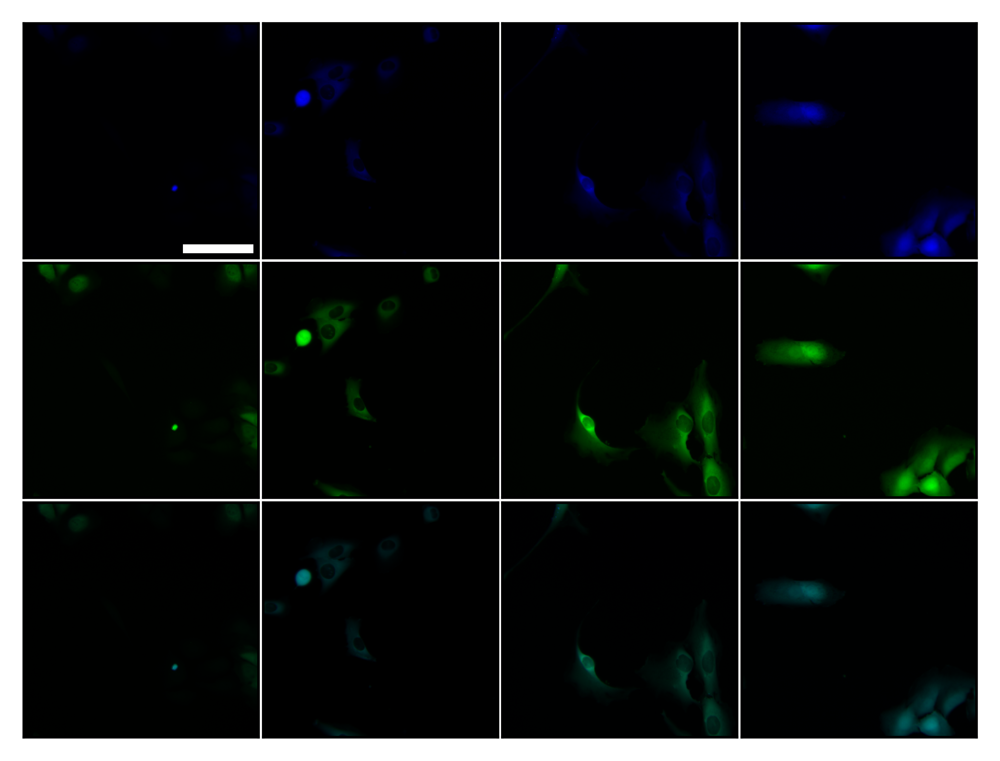

In [78]:
colors = [[(0, 0, 0), (0, 0, 1)], [(0, 0, 0), (0, 1, 0)]]
color_map_name = ['black_to_blue', 'black_to_green']
plot_images(new_tmp_img, 3, 4, colors, color_map_name, dpi=750, figsize=(4,3), save_file=r'D:\Patrick\Cell_basal_image.svg')

In [25]:
plot_img = image_holder.isel(img=0, t=0, ch=0)

imp = plot_img.isel(row=slice(512,1536), col = slice(512, 1536))
imp.sizes

Frozen({'row': 1024, 'col': 1024})

In [34]:
infection_images = [r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-E7_construct-GS32_experiment-Infection_experimentcondition-Growth_replicate-1_passages-26_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',
                   r'D:\Patrick\Infection\New_parameters\20250314_infection_save\Tif\aligned_images\date-20250316_techReplicate-1_well-E10_construct-GS32_experiment-Infection_experimentcondition-Infection_replicate-1_passages-26_exposurecam1-25_exposurecam2-25_cyanled-12U5_blueled-12U5_greenled-6U5.tif',]

In [36]:
new_images = concat_multiple_images(ij, infection_images, channel=[0,1,3], timepoint=[1, 3, 6, 8])

In [43]:
def get_global_vscale(image, plotting_channels, crop_region=None):
    """Compute global vmin/vmax for each channel across all images and timepoints."""
    vscales = []
    for ch in range(plotting_channels):
        
        all_vals = []
        for i in range(image.sizes['img']):
            tmp_img = image.isel(img=i)
            
            for t in range(tmp_img.sizes['t']):
                
                sub_img = tmp_img.isel(t=t, ch=ch)
                if crop_region:
                    sub_img = sub_img.isel(row=slice(*crop_region['row']), col=slice(*crop_region['col']))
                all_vals.append(sub_img.values)
        combined = np.concatenate([arr.ravel() for arr in all_vals])
        vmin, vmax = np.percentile(combined, [1, 99])  # robust min/max
        vscales.append((vmin, vmax))
    return vscales

def plot_images(image, 
                plotting_channels: int, 
                cols_to_plot: int, 
                colors: list[list[tuple]], 
                cmap_name: list[str],
                vscale: list | str | None = None,
                save_file=None,
                merged_channel=True, 
                dpi=500, 
                figsize=(13, 3),
                pixel_per_micron=3.0769,
                crop_region=None):
    
    # Plot config
    plot_iterator = plotting_channels - 1 if merged_channel else plotting_channels
    cmaps = make_cmaps(cmap_name, colors)
    mpl.rcParams['figure.dpi'] = dpi
    fig, ax = plt.subplots(plotting_channels, cols_to_plot, figsize=figsize)
    ax = np.atleast_2d(ax)
    time_tracker = 0

    # Crop setup
    if crop_region is None:
        crop_region = {'row': (512, 1536), 'col': (512, 1536)}

    # Compute vscale if not provided
    if vscale is None or vscale == "auto":
        vscale_channels =plotting_channels
        if merged_channel:
            vscale_channels= vscale_channels -1
        vscale = get_global_vscale(image, vscale_channels, crop_region)

    for i in range(image.sizes['img']):
        tmp_img = image.isel(img=i)
        timepoints = tmp_img.sizes['t']
        for t in range(timepoints):
            new_img = tmp_img.isel(t=t) if timepoints > 1 else tmp_img
            for x in range(plot_iterator):
                cmap = cmaps[x]
                plot_img = new_img.isel(ch=x)
                sub_img = plot_img.isel(
                    row=slice(*crop_region['row']), col=slice(*crop_region['col'])
                )
                vmin, vmax = vscale[x]
                ax[x, time_tracker].imshow(sub_img, cmap=cmap, vmin=vmin, vmax=vmax)
                ax[x, time_tracker].set_xticks([])
                ax[x, time_tracker].set_yticks([])

                if merged_channel:
                    alpha = 1 / (x + 1)
                    ax[plot_iterator, time_tracker].imshow(sub_img, cmap=cmap,
                                                           vmin=vmin, vmax=vmax,
                                                           alpha=alpha)
                    ax[plot_iterator, time_tracker].set_xticks([])
                    ax[plot_iterator, time_tracker].set_yticks([])
            time_tracker += 1

    plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.02, wspace=0.02)

    # Add scalebar
    x_len = image.sizes['row']
    scale_size = 100
    scalebar = set_scalebar(scale_size, x_len, pixel_per_micron)
    ax[0, 0].add_artist(scalebar)

    # Save output
    if save_file:
        save_format = save_file.split('.')[-1]
        plt.savefig(save_file, format=save_format, bbox_inches='tight')

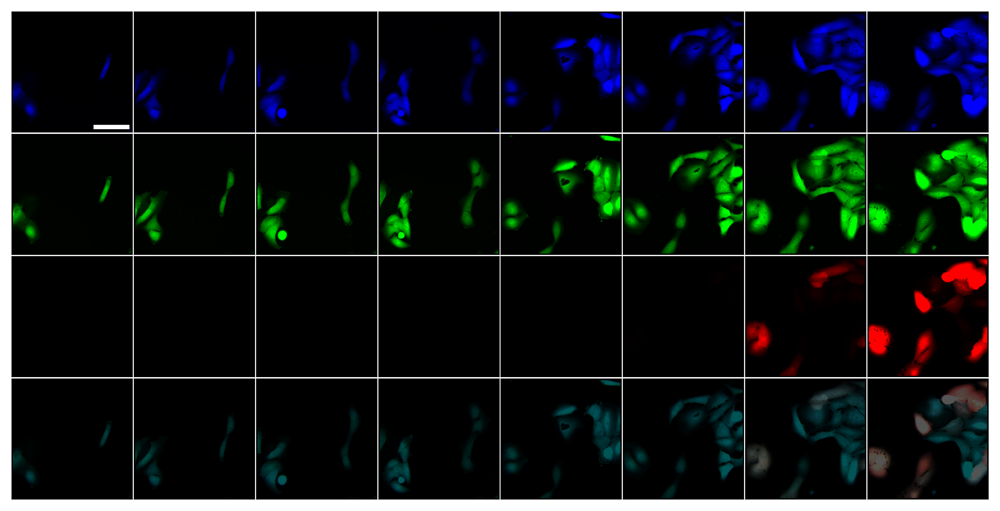

In [52]:
save_file = r'D:\Patrick\Infected_image.png'
colors = [[(0, 0, 0), (0, 0, 1)], [(0, 0, 0), (0, 1, 0)], [(0, 0, 0), (1, 0, 0)]]
color_map_name = ['black_to_blue', 'black_to_green', 'black_to_red']
plot_images(new_images, 4, 8, colors, color_map_name, save_file=save_file, dpi=750, figsize=(8,4))
#, save_file=r'D:\OneDrive\Virus\Paper1\New_fig\basal_cell_fig.png'